In [1]:
"""
Class
- Normalize Data
- Harmonize Data
- Build Classifier
- Classify
- Split
- - Class
"""

'\nClass\n- Normalize Data\n- Harmonize Data\n- Build Classifier\n- Classify\n- Split\n- - Class\n'

In [2]:
import sys
sys.path.insert(0, '/home/fangming/projects/dredfish/packages/PySpots/')
sys.path.insert(0, '/home/fangming/projects/myutils/')

import scanpy as sc
import anndata

from fish_helpers import *
import basicu
sc.set_figure_params(figsize=(7, 7))

In [3]:
prj_dir = '/home/fangming/projects/dredfish/'
dat_dir = prj_dir + 'data/'
res_dir = prj_dir + 'results/'
fig_dir = prj_dir + 'figures/'

In [4]:
%%time
""" Data """
""" Load Measured Data """
measured_data = anndata.read(f'{dat_dir}pilot/raw_fishdata.h5ad')
print(measured_data.shape)
    
""" Load SmartSeq Reference """
# allen matrix
ref_SS_data = anndata.read(f'{dat_dir}rna/scrna_ss_ctxhippo_a_exon_DPNMF_matrix.h5ad')
print(ref_SS_data.shape)

(97786, 24)
(73347, 24)
CPU times: user 558 ms, sys: 4.15 s, total: 4.71 s
Wall time: 4.78 s


In [5]:
# normalization
rawmat = np.clip(measured_data.layers['total_vectors'].copy(), 0, None)
bitssum = rawmat.sum(axis=1)
rawmat = rawmat/bitssum.reshape(-1,1) 

In [6]:
celltype_levels = [
    'class_label', 
    'neighborhood_label', 
    'subclass_label', 
    # 'supertype_label', 
    'cluster_label',
]


ref_SS_data.obs = ref_SS_data.obs.rename(columns={
    'class_label': 'Level_1_class_label', 
    'neighborhood_label': 'Level_2_neighborhood_label', 
    'subclass_label': 'Level_3_subclass_label', 
    # 'supertype_label', 
    'cluster_label': 'Level_5_cluster_label', # temporary
})
ref_SS_data.obsm['Level_1_class_label'] = ref_SS_data.obs['Level_1_class_label'].values.astype(object)
ref_SS_data.obsm['Level_2_neighborhood_label'] = ref_SS_data.obs['Level_2_neighborhood_label'].values.astype(object)
ref_SS_data.obsm['Level_3_subclass_label'] = ref_SS_data.obs['Level_3_subclass_label'].values.astype(object)
ref_SS_data.obsm['Level_5_cluster_label'] = ref_SS_data.obs['Level_5_cluster_label'].values.astype(object)
ref_SS_data

AnnData object with n_obs × n_vars = 73347 × 24
    obs: 'donor_sex_id', 'donor_sex_label', 'donor_sex_color', 'region_id', 'region_label', 'region_color', 'platform_label', 'cluster_order', 'Level_5_cluster_label', 'cluster_color', 'subclass_order', 'Level_3_subclass_label', 'subclass_color', 'neighborhood_id', 'Level_2_neighborhood_label', 'neighborhood_color', 'class_order', 'Level_1_class_label', 'class_color', 'exp_component_name', 'external_donor_name_label', 'full_genotype_label', 'facs_population_plan_label', 'injection_roi_label', 'injection_materials_label', 'injection_method_label', 'injection_type_label', 'full_genotype_id', 'full_genotype_color', 'external_donor_name_id', 'external_donor_name_color', 'facs_population_plan_id', 'facs_population_plan_color', 'injection_materials_id', 'injection_materials_color', 'injection_method_id', 'injection_method_color', 'injection_roi_id', 'injection_roi_color', 'injection_type_id', 'injection_type_color', 'cell_type_accession_label',

In [7]:
# store
measured_data.layers['DPNMF'] = rawmat 
ref_SS_data.layers['DPNMF'] = ref_SS_data.X

In [8]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

class RecursiveClassify(object):
    def __init__(self,data,ref_data,level,verbose=True):
        self.data = data
        self.ref_data = ref_data
        self.level = level
        self.verbose = verbose
        
    def run(self):
        self.normalizeData()
        self.harmonizeData()
        self.classifyData()
        self.splitData()
        
    def normalizeData(self):
        # def normalize_vector(v):
        #     v = v.copy()
        #     v = v-np.percentile(v,50)
        #     v = v/(np.percentile(v,75)-np.percentile(v,25))
        #     return v
        def zscore(v, **kwargs):
            return (v-np.mean(v, **kwargs))/(np.std(v, **kwargs))

        def zscore_matrix_bycol(mat):
            return zscore(mat, axis=0) # across rows
        
        data = np.array(self.data.layers['DPNMF'].copy())
        ref_data = np.array(self.ref_data.layers['DPNMF'].copy())
        
        
        data = zscore_matrix_bycol(data)
        ref_data = zscore_matrix_bycol(ref_data)
        
        # for i in range(data.shape[1]):
        #     """ Scale bitwise first """
        #     data[:,i] = normalize_vector(data[:,i])
        #     ref_data[:,i] = normalize_vector(ref_data[:,i])
        
        self.data.layers['DPNMF_IQR'] = data.copy()
        self.ref_data.layers['DPNMF_IQR'] = ref_data.copy()
        
    def harmonizeData(self):
        merged_data = anndata.AnnData(X=np.concatenate([self.data.layers['DPNMF_IQR'].astype(float),self.ref_data.layers['DPNMF_IQR'].astype(float)]),
                                      var=np.array(self.data.var).astype(str),
                                      obs=np.concatenate([np.array(self.data.obs.index).astype(str),np.array(self.ref_data.obs.index).astype(str)]).astype(str))
        merged_data.obs['dataset'] = np.concatenate([np.array(['a' for i in range(len(self.data.obs))]),np.array(['b' for i in range(len(self.ref_data.obs))])]).astype(str)
        merged_data.obsm['DPNMF'] = merged_data.X.copy()
        merged_data.layers['DPNMF'] = merged_data.X.copy()
        merged_data.raw = merged_data

#         import scanpy.external as sce
#         sce.pp.harmony_integrate(merged_data, 'dataset',basis='DPNMF',adjusted_basis='DPNMF_harmony')#,reference_values='b')
    
#         self.data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'a'].obsm['DPNMF_harmony'])
#         self.ref_data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'b'].obsm['DPNMF_harmony'])

        self.data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'a'].obsm['DPNMF'])
        self.ref_data.obsm['DPNMF_harmony'] = np.array(merged_data[merged_data.obs['dataset'] == 'b'].obsm['DPNMF'])
        
    def classBalance(self):
        """ Class Balance """
        n_cells = 100
        X = self.ref_data.obsm['DPNMF_harmony'].copy()
        Y = np.array(self.ref_data.obsm[self.level])
        Y_unique = np.unique(Y)
        X_balanced = []
        Y_balanced = []
        for y in Y_unique:
            idx = np.where(Y==y)[0]
            if idx.shape[0]>n_cells:
                idx = np.random.choice(idx,n_cells,replace=False)
            else:
                idx = np.random.choice(idx,n_cells,replace=True)
            X_balanced.append(X[idx,:])
            Y_balanced.append(Y[idx])
        self.X_balanced = np.concatenate(X_balanced)
        self.Y_balanced = np.concatenate(Y_balanced)
    
    def splitTestTrain(self):
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X_balanced, self.Y_balanced, test_size=0.4, random_state=42)
        
    def buildModel(self):
        self.method = 'KNeighborsClassifier'
        self.model =  KNeighborsClassifier(15,metric='correlation')
        
    def trainModel(self):
        self.model.fit(self.X_train,self.y_train)
        
    def predictLabels(self):
        self.data.obs[self.level+'_predicted'] = self.model.predict(self.data.obsm['DPNMF_harmony'].copy())
        
    def classifyData(self):
        self.classBalance()
        self.splitTestTrain()
        self.buildModel()
        self.trainModel()
        self.predictLabels()
        
    def splitData(self):
        levels = np.array([i for i in self.ref_data.obsm if i.split('_')[0]=='Level'])
        for level in levels:
            self.ref_data.obs[level] = np.array(self.ref_data.obsm[level])
        loc = np.where(levels==self.level)[0][0]+1
        if loc>=len(levels):
            """ No More Levels"""
        else:
            next_level = levels[loc]
            self.data.obs[next_level+'_predicted'] = np.array(['Unknown' for i in range(self.data.shape[0])])
            ref_data_labels = np.array(self.ref_data.obs[self.level])
            data_labels = np.array(self.data.obs[self.level+'_predicted'])
            unique_labels = np.unique(data_labels)
            if self.verbose:
                if self.level ==levels[0]:
                    level = self.level
                else:
                    previous_level = levels[loc-2]
                    level = self.level + '_' + str(np.unique(self.ref_data.obs[previous_level])[0])
                iterable = tqdm(unique_labels,desc=level)
            else:
                iterable = unique_labels
            for label in iterable:
                try:
                    self.rc = RecursiveClassify(self.data[data_labels==label].copy(),self.ref_data[ref_data_labels==label].copy(),next_level,verbose=self.verbose)
                    self.rc.run()
                except Exception as e:
                    print(e)
                    print(label+'_Failed')
                for level in levels:
                        if level+'_predicted' in self.rc.data.obs:
                            if not level+'_predicted' in self.data.obs:
                                self.data.obs[level+'_predicted'] = np.array(['Unknown' for i in range(self.data.shape[0])])
                            try:
                                temp = np.array(self.data.obs[level+'_predicted'])
                                temp[data_labels==label] = np.array(self.rc.data.obs[level+'_predicted'])
                                self.data.obs[level+'_predicted'] = temp
                            except:
                                print(level+'_predicted '+label)
                                continue

In [9]:
data = measured_data.copy()
ref_data  = ref_SS_data.copy()# _balanced.copy()
levels = [i for i in ref_data.obsm if i.split('_')[0]=='Level']           
data.shape, ref_data.shape, levels

((97786, 24),
 (73347, 24),
 ['Level_1_class_label',
  'Level_2_neighborhood_label',
  'Level_3_subclass_label',
  'Level_5_cluster_label'])

In [10]:
rc = RecursiveClassify(data,ref_data,levels[0],verbose=True)
rc.run()    

Level_2_neighborhood_label_GABAergic:   0%|          | 0/3 [00:00<?, ?it/s]

Level_3_subclass_label_CGE:   0%|          | 0/3 [00:00<?, ?it/s]/tmp/ipykernel_199912/775362323.py:26: RuntimeWarning: invalid value encountered in true_divide
  return (v-np.mean(v, **kwargs))/(np.std(v, **kwargs))


Level_3_subclass_label_CGE:  33%|███▎      | 1/3 [00:00<00:00,  9.22it/s]

Input contains NaN, infinity or a value too large for dtype('float32').
Lamp5_Failed




Level_3_subclass_label_CGE:  67%|██████▋   | 2/3 [00:00<00:00,  3.27it/s]

Level_3_subclass_label_CGE: 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

Level_2_neighborhood_label_GABAergic:  33%|███▎      | 1/3 [00:03<00:06,  3.12s/it]

Level_3_subclass_label_MGE:   0%|          | 0/3 [00:00<?, ?it/s]

Level_3_subclass_label_MGE:  33%|███▎      | 1/3 [00:01<00:03,  1.83s/it]

Level_3_subclass_label_MGE:  67%|██████▋   | 2/3 [00:08<00:04,  4.46s/it]

Level_3_subclass_label_MGE: 100%|██████████| 3/3 [00:08<00:00,  2.75s/it]

Level_2_neighborhood_label_GABAergic:  67%|██████▋   | 2/3 [00:12<00:07,  7.03s/it]

Level_3_subclass_label_Other:   0%|          | 0/1 [00:00<?, ?it/s]

Level_3_subclass_label_Other: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

Level_2_neighborhood_label_Glutamatergic:   0%|          | 0/6 [00:00<?, ?it/s]

Level_3_subclass_label_DG/SUB/CA:   0%|          | 0/5 [00:00<?, ?it/s]

Level_3_subclass_label_DG/SUB/CA:  20%|██        | 1/5 [00:00<00:00,  5.31it/s]

Level

In [11]:
rc.data

AnnData object with n_obs × n_vars = 97786 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'stage_x', 'stage_y', 'Level_1_class_label_predicted', 'Level_2_neighborhood_label_predicted', 'Level_3_subclass_label_predicted', 'Level_5_cluster_label_predicted'
    obsm: 'stage', 'DPNMF_harmony'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors', 'DPNMF', 'DPNMF_IQR'

/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Level_1_class_label_predicted' as categorical
/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Level_2_neighborhood_label_predicted' as categorical
/home/fangming/anaconda3/envs/routine/lib/python3.10/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Cate

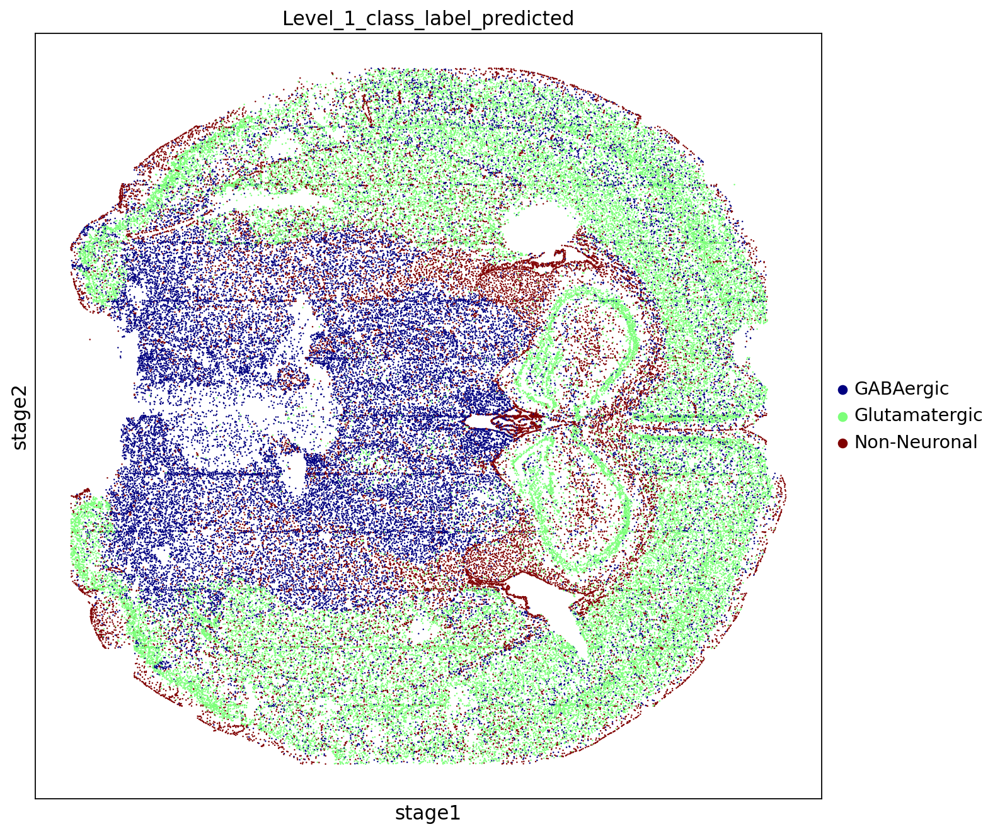

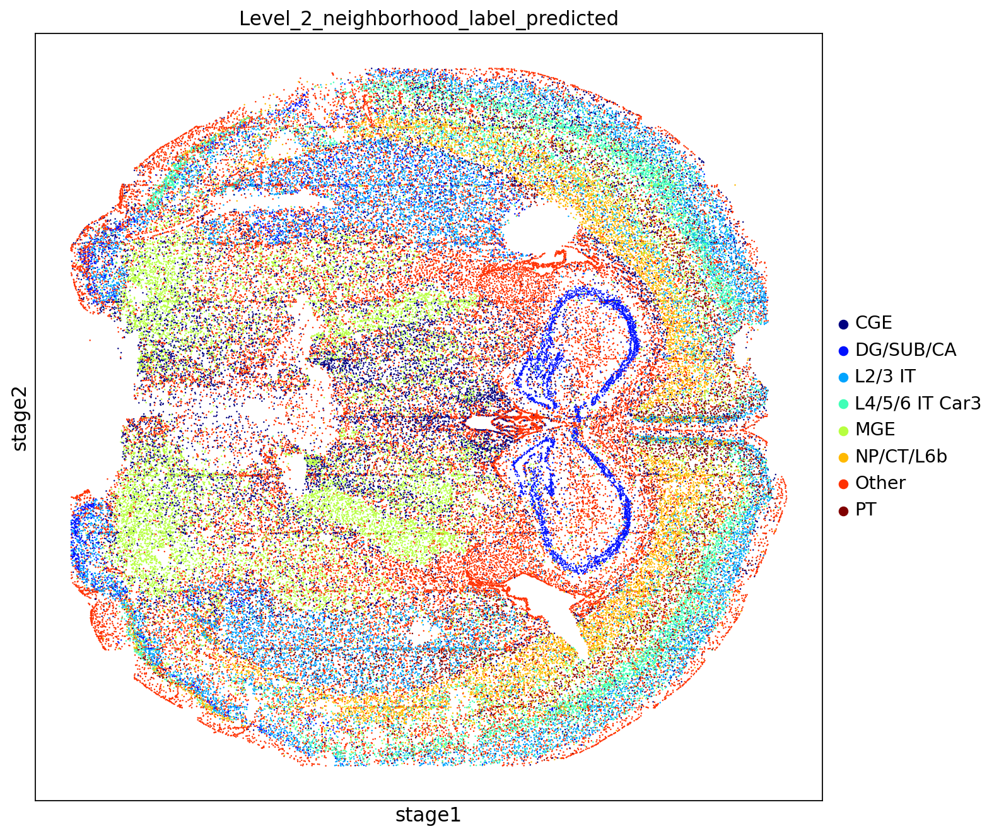

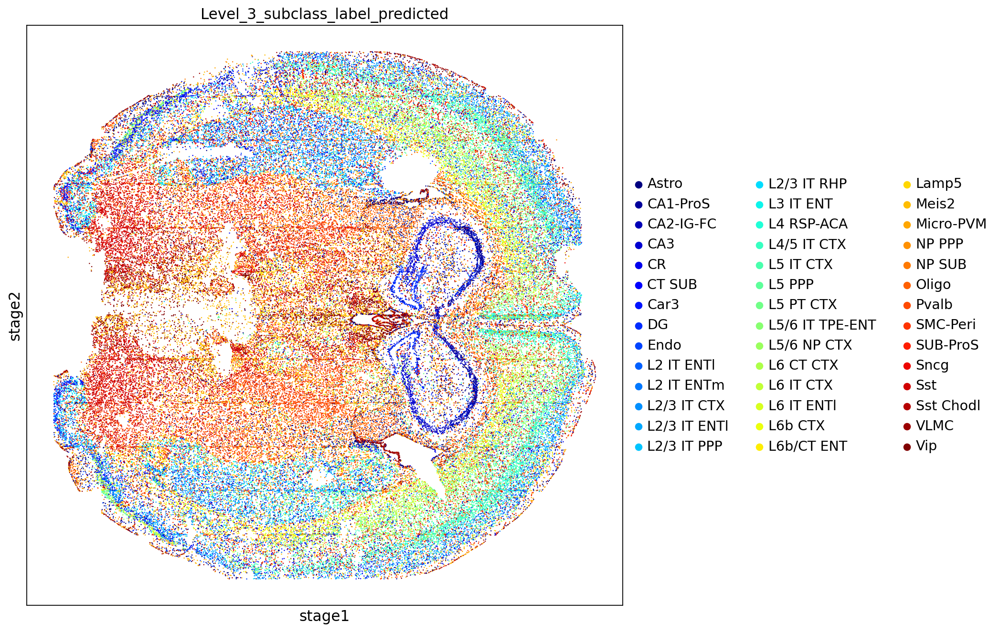

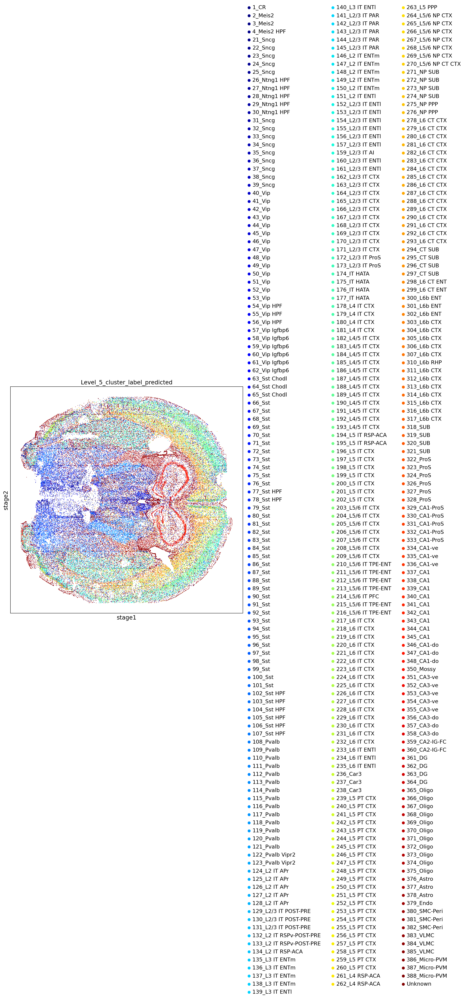

In [12]:
sc.set_figure_params(figsize=[10,10])
levels = [i for i in rc.data.obs if i.split('_')[0]=='Level']  
for level in levels:
    rc.data.obsm[level] = np.array(rc.data.obs[level])
    sc.pl.embedding(rc.data,'stage', color=[level],palette='jet',size=5)

In [13]:
data = rc.data

In [14]:
# data

In [15]:
levels = np.array(levels)
for i,level in enumerate(levels):
    print(i, level)
    temp2 = np.array(data.obs[levels[i]])
    if 'Other' in np.unique(data.obs[level]):
        temp = np.array([i+'_Other' for i in data.obs[levels[i-1]]])
        temp2 = np.array(data.obs[levels[i]])
        temp2[temp2=='Other'] = temp[temp2=='Other']
    data.obs[levels[i]+'_updated'] = np.array(temp2)
    data.obsm[levels[i]+'_updated'] = np.array(data.obs[levels[i]+'_updated'])
    # sc.pl.embedding(data,'stage', color=['leiden',levels[i]+'_updated'],palette='jet',size=4)
    
#     data_labels = np.array(data.obs[levels[i]+'_updated'])
#     ref_data_labels = np.array(data.obs['opt_types'])
#     data_labels_unique = np.unique(data_labels)
#     ref_data_labels_unique = np.unique(ref_data_labels)
#     cmat = np.zeros([data_labels_unique.shape[0],ref_data_labels_unique.shape[0]])
#     for i,i_label in tqdm(enumerate(data_labels_unique),total=data_labels_unique.shape[0]):
#         i_mask =data_labels==i_label
#         for j,j_label in enumerate(ref_data_labels_unique):
#             j_mask = ref_data_labels==j_label
#             cmat[i,j] = np.sum(i_mask&j_mask)
#     cmat = cmat/cmat.sum(0)[:,None].T
#     cmat = pd.DataFrame(cmat,index=data_labels_unique,columns=ref_data_labels_unique)
#     idx_order = []
#     for idx,i in enumerate(cmat.index):
#         if 'Level_5' in level:
#             if i=='Unknown':
#                 idx_order.append(0)
#             else:
#                 idx_order.append(int(i.split('_')[0]))
#         else:
#             idx_order.append(idx)
#     idx_order = np.array(cmat.index)[np.argsort(np.array(idx_order))]
#     column_order = []
#     for idx,i in enumerate(cmat.columns):
#         N = 0
#         for j,n in enumerate(i.split('_')):
#             N+=(10**-j)*int(n)
#         column_order.append(N)
#     column_order = np.array(cmat.columns)[np.argsort(np.array(column_order))]
#     cmat  = cmat[column_order].loc[idx_order]
#     plt.figure(figsize=[15,15])
#     p = sns.clustermap(cmat.T,cmap='jet',vmin=0,vmax=1,col_cluster=False)

0 Level_1_class_label_predicted
1 Level_2_neighborhood_label_predicted
2 Level_3_subclass_label_predicted
3 Level_5_cluster_label_predicted


In [16]:
for level in rc.data.obsm:
    if 'updated' in level:
        print(level.split('_updated')[0])
        measured_data.obs[level.split('_updated')[0]] = np.array(rc.data.obsm[level])
        measured_data.obsm[level.split('_updated')[0]] = np.array(rc.data.obsm[level])

Level_1_class_label_predicted
Level_2_neighborhood_label_predicted
Level_3_subclass_label_predicted
Level_5_cluster_label_predicted


In [17]:
# measured_data.write(filename=os.path.join(measured_path,'labeled_renorm_noHarmony_March18.h5ad'))
# measured_data

output = f'{dat_dir}pilot/labeled_renorm_zscore_noHarmony_March23.csv'
print(output)
measured_data.obs.to_csv(output, header=True, index=True)

/home/fangming/projects/dredfish/data/pilot/labeled_renorm_zscore_noHarmony_March23.csv


In [19]:
measured_data.obs['Level_1_class_label_predicted'].unique()

array(['Glutamatergic', 'GABAergic', 'Non-Neuronal'], dtype=object)